# Hyperspectral data augmentation with `cuvis-ai-augment`

End-to-end tutorial for the **eight transforms across four families** shipped in
[`cuvis-ai-augment`](https://github.com/cubert-hyperspectral/cuvis-ai-augment) v0.2.0.

| Family | Transforms |
|---|---|
| **Spatial** | `RandomHorizontalFlip`, `RandomVerticalFlip`, `Random90Rotate`, `RandomSpatialCrop` |
| **Spectral** | `GaussianBandNoise`, `RandomBandDropout` |
| **Photometric** | `MultiplicativeIlluminationScaling` |
| **Mixing / erasing** | `Cutout` |

We use a real lentils hyperspectral cube (334 × 334 × 61 bands, loaded in calibrated reflectance via the CUVIS SDK) and walk through each transform with **before/after three-band panels** — low, mid, and high band indices side by side. Showing all three bands proves that spatial transforms apply identically across every channel, and that spectral/photometric transforms perturb the spectral dimension without touching spatial structure.

All transforms operate on `(B, H, W, C)` float32 cubes and `(B, H, W)` int32 masks — the same random decision drives cube and mask in lockstep.

## Prerequisites

> - Python 3.11+
> - `cuvis-ai-augment` installed (the Colab cell below does this if needed).
> - Internet access on first run to download the lentils cube from HuggingFace (`huggingface_hub` handles caching to `~/.cache/huggingface/`).
> - No HuggingFace login required — the dataset is public.

## 1 · Setup

In [1]:
# Colab bootstrap — installs the plugin and notebook extras. No-op outside Colab.
import sys

IN_COLAB = "google.colab" in sys.modules
if IN_COLAB:
    %pip install -q "cuvis-ai-augment[notebooks]" huggingface_hub matplotlib

In [2]:
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import torch

from cuvis_ai_augment.node.compose import AugmentationCompose

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"torch={torch.__version__}, device={device}")
print(f"AugmentationCompose.available_transforms() = {AugmentationCompose.available_transforms()}")

torch=2.11.0+cpu, device=cpu
AugmentationCompose.available_transforms() = ['Cutout', 'GaussianBandNoise', 'MultiplicativeIlluminationScaling', 'Random90Rotate', 'RandomBandDropout', 'RandomHorizontalFlip', 'RandomSpatialCrop', 'RandomVerticalFlip']


## 2 · Load the lentils cube

The cube is loaded in **calibrated reflectance** using the CUVIS SDK:
`ProcessingMode.Reflectance` applies `(raw − dark) / (white − dark)` using the dark
and white reference frames embedded in the `.cu3s` session file.
The SDK returns values scaled ×10 000; dividing by 10 000 gives physical reflectance
where 1.0 equals the white reference panel. Values above 1.0 (specular highlights) are
preserved.

The notebook tries three data sources in order so it runs anywhere:

1. **HuggingFace** — pulls `Auto_003+01.cu3s` from the public
   `cubert-gmbh/XMR_Demo_Industrial_Foreign_Object_Detection_Lentils` dataset
   (cached to `~/.cache/huggingface/` after the first download).
2. **Local path** — edit `LOCAL_CANDIDATES` to point at a local `.cu3s` file.
3. **Synthetic fallback** — a small random cube so the notebook still runs
   without any data files (geometry checks still pass; spectral plots are noise).

In [3]:
LENTILS_DEMO_REPO = "cubert-gmbh/XMR_Demo_Industrial_Foreign_Object_Detection_Lentils"
LENTILS_CU3S_FILE = "measurements/cu3s/2026_04_15_13_32_55/Auto_003+01.cu3s"

LOCAL_CANDIDATES = [
    Path("C:/Users/anish.raj/projects/gitlab_cuvis_ai_3/cuvis.ai/data/Lentils/Lentils_000.cu3s"),
    Path(
        "C:/Users/anish.raj/projects/gitlab_cuvis_ai_3/cuvis-ai-adaclip-latest/data/Lentils/Lentils_000.cu3s"
    ),
    Path("data/Lentils/Lentils_000.cu3s"),
]


def _open_cu3s_to_cube(cu3s_path: Path) -> torch.Tensor:
    """Open a .cu3s, return a (1, H, W, C) float32 cube cropped to a centred square
    and downsampled so matplotlib stays snappy."""
    import cuvis  # type: ignore[import-not-found]

    sess = cuvis.SessionFile(str(cu3s_path))
    mesu = sess.get_measurement(0)
    mesu.refresh()
    # Load as calibrated reflectance (dark + white reference correction).
    # ProcessingMode.Reflectance returns (raw-dark)/(white-dark) scaled x10000;
    # dividing by 10000 gives physical reflectance in [0, 1] (1.0 = white panel).
    proc = cuvis.ProcessingContext(sess)
    proc_args = cuvis.ProcessingArgs()
    proc_args.processing_mode = cuvis.ProcessingMode.Reflectance
    proc.set_processing_args(proc_args)
    mesu = proc.apply(mesu)
    arr = mesu.cube.array.astype(np.float32) / 10000.0
    H, W = arr.shape[:2]
    side = min(H, W)
    top, left = (H - side) // 2, (W - side) // 2
    arr = arr[top : top + side, left : left + side, :]
    stride = max(side // 256, 1)
    arr = arr[::stride, ::stride, :]
    return torch.from_numpy(arr).unsqueeze(0)


def load_lentils_cube() -> tuple[torch.Tensor, str]:
    """Return (cube, source_label). Tries HF → local paths → synthetic stripe."""
    # 1. HuggingFace.
    try:
        from huggingface_hub import hf_hub_download  # type: ignore[import-not-found]

        cu3s_path = Path(
            hf_hub_download(
                repo_id=LENTILS_DEMO_REPO,
                filename=LENTILS_CU3S_FILE,
                repo_type="dataset",
            )
        )
        cube = _open_cu3s_to_cube(cu3s_path)
        return cube, f"HuggingFace {LENTILS_DEMO_REPO}: {cu3s_path.name}"
    except Exception as exc:  # pragma: no cover - notebook-side fallback
        print(f"HF path skipped: {type(exc).__name__}: {exc}")

    # 2. Local candidates.
    try:
        for path in LOCAL_CANDIDATES:
            if path.exists():
                cube = _open_cu3s_to_cube(path)
                return cube, f"Local: {path.name}"
    except Exception as exc:
        print(f"Local path skipped: {type(exc).__name__}: {exc}")

    # 3. Synthetic fallback.
    torch.manual_seed(0)
    H = W = 128
    C = 32
    cube = torch.rand((1, H, W, C), dtype=torch.float32)
    for i in range(min(H, W)):
        cube[0, i, i, :] = 1.0  # bright diagonal so geometry is visible.
    return cube, "Synthetic stripe (no HF / no local .cu3s)"


cube, source_label = load_lentils_cube()
B, H, W, C = cube.shape
print(f"Loaded cube from: {source_label}")
print(f"cube shape = {tuple(cube.shape)}, dtype = {cube.dtype}")

# Build a synthetic disc mask (off-centre, asymmetric) so we can see it move.
yy, xx = torch.meshgrid(torch.arange(H), torch.arange(W), indexing="ij")
cy, cx = H // 3, W // 3
r = min(H, W) // 8
mask = (((yy - cy) ** 2 + (xx - cx) ** 2) <= r**2).to(torch.int32).unsqueeze(0)
print(
    f"mask shape = {tuple(mask.shape)}, dtype = {mask.dtype}, positive pixels = {int(mask.sum())}"
)

Loaded cube from: HuggingFace cubert-gmbh/XMR_Demo_Industrial_Foreign_Object_Detection_Lentils: Auto_003+01.cu3s
cube shape = (1, 334, 334, 61), dtype = torch.float32
mask shape = (1, 334, 334), dtype = torch.int32, positive pixels = 5261


## 3 · Three-band visualisation helpers

Hyperspectral cubes have 61 bands — far too many to show at once. The helpers below pick three representative band indices (low / mid / high, at 15 %, 50 %, and 85 % of the spectral range) and display them as separate grayscale panels with the mask overlaid in red.

Using **three independent band panels** rather than one false-colour composite catches axis-swap bugs: if a transform accidentally applied different geometry to band 5 vs band 30, the two panels would disagree — impossible to miss.

In [4]:
def _pick_3bands(C: int) -> list[int]:
    """Three band indices spread across the spectrum (low / mid / high)."""
    return [
        max(0, int(C * 0.15)),
        int(C * 0.50),
        min(C - 1, int(C * 0.85)),
    ]


def to_uint8_band(cube_b: torch.Tensor, band: int) -> np.ndarray:
    """Return a uint8 grayscale (H, W, 3) image of a single band, min-max normalised."""
    g = cube_b[..., band].cpu().numpy().astype(np.float32)
    lo, hi = float(g.min()), float(g.max())
    g = (g - lo) / max(hi - lo, 1e-9)
    return np.stack([g, g, g], axis=-1)


def overlay_mask(rgb: np.ndarray, mask_b: torch.Tensor, alpha: float = 0.45) -> np.ndarray:
    """Blend a red overlay onto a 3-channel image wherever mask > 0."""
    m = (mask_b.cpu().numpy() > 0).astype(np.float32)[..., None]
    red = np.zeros_like(rgb)
    red[..., 0] = 1.0
    return np.clip((1 - alpha * m) * rgb + alpha * m * red, 0, 1)


def show_before_after_3bands(
    cube_before: torch.Tensor,
    mask_before: torch.Tensor | None,
    cube_after: torch.Tensor,
    mask_after: torch.Tensor | None,
    title: str,
    bands: list[int] | None = None,
    sample_idx: int = 0,
) -> None:
    """2 rows x 3 cols figure: top = original at 3 bands, bottom = augmented at the same 3 bands.

    Mask overlay drawn on each panel. Verify the bottom-row geometry matches the top-row
    geometry under the expected transform — and that all three columns agree.
    """
    if bands is None:
        bands = _pick_3bands(cube_before.shape[-1])
    fig, axes = plt.subplots(2, 3, figsize=(11, 7))
    for col, band in enumerate(bands):
        rgb_b = to_uint8_band(cube_before[sample_idx], band)
        rgb_a = to_uint8_band(cube_after[sample_idx], band)
        if mask_before is not None:
            rgb_b = overlay_mask(rgb_b, mask_before[sample_idx])
        if mask_after is not None:
            rgb_a = overlay_mask(rgb_a, mask_after[sample_idx])
        axes[0, col].imshow(rgb_b)
        axes[0, col].set_title(f"original · band {band}")
        axes[0, col].axis("off")
        axes[1, col].imshow(rgb_a)
        axes[1, col].set_title(f"augmented · band {band}")
        axes[1, col].axis("off")
    fig.suptitle(title, fontsize=13)
    plt.tight_layout()
    plt.show()


def run_single_transform(spec: dict, title: str, seed: int = 0) -> dict:
    """Build a one-transform Compose Node, run forward, render the 2x3 panel."""
    node = AugmentationCompose(transforms=[spec], seed=seed)
    out = node.forward(cube=cube, mask=mask)
    show_before_after_3bands(cube, mask, out["cube"], out.get("mask"), title)
    return out


BANDS = _pick_3bands(C)
print(f"3-band visualisation indices for C={C}: {BANDS}")

3-band visualisation indices for C=61: [9, 30, 51]


### Original cube — three bands with mask overlay

Reference panel. The mask (red overlay) marks foreign-object pixels. Keep this in mind when comparing the augmented outputs below.

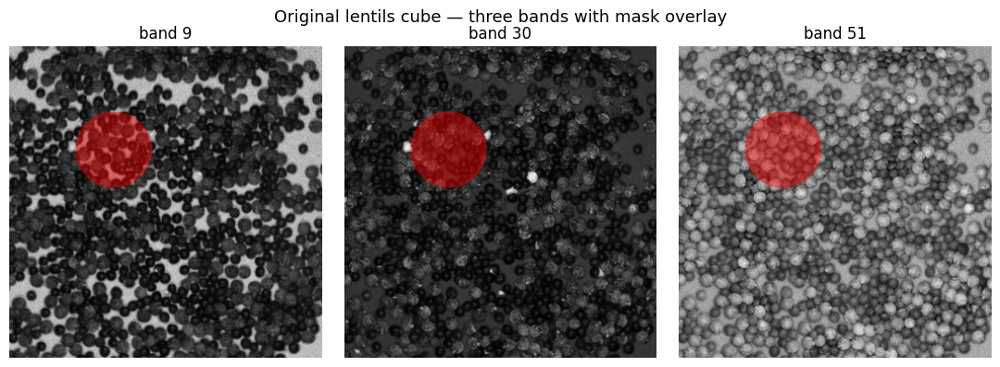

In [5]:
fig, axes = plt.subplots(1, 3, figsize=(11, 4))
for col, band in enumerate(BANDS):
    rgb = overlay_mask(to_uint8_band(cube[0], band), mask[0])
    axes[col].imshow(rgb)
    axes[col].set_title(f"band {band}")
    axes[col].axis("off")
fig.suptitle("Original lentils cube — three bands with mask overlay", fontsize=13)
plt.tight_layout()
plt.show()

## 4 · `RandomHorizontalFlip` (spatial)

Mirrors the **width axis** left ↔ right. The disc in the mask moves to the horizontally mirrored position; all 61 band panels agree on the flip direction.

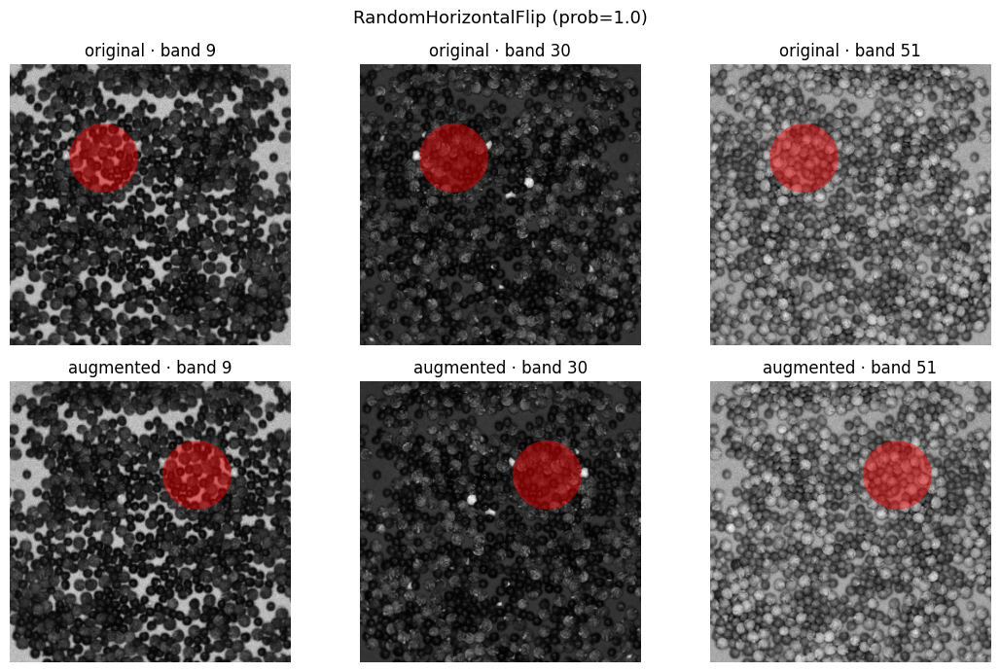

In [6]:
_ = run_single_transform(
    {"type": "RandomHorizontalFlip", "prob": 1.0},
    title="RandomHorizontalFlip (prob=1.0)",
    seed=0,
)

## 5 · `RandomVerticalFlip` (spatial)

Mirrors the **height axis** top ↔ bottom. The same vertical flip appears identically in every band.

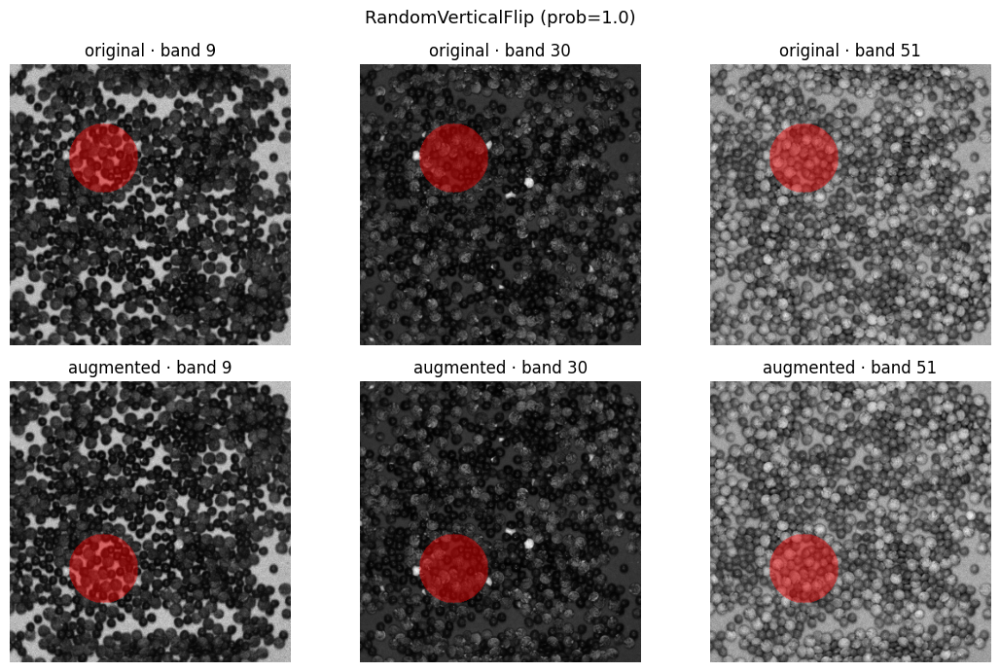

In [7]:
_ = run_single_transform(
    {"type": "RandomVerticalFlip", "prob": 1.0},
    title="RandomVerticalFlip (prob=1.0)",
    seed=0,
)

## 6 · `Random90Rotate` (spatial)

Rotates by a random multiple of 90° (k ∈ {1, 2, 3}) drawn per sample. Three seeds below show k=1, k=2, and k=3 so you can verify all three cases.

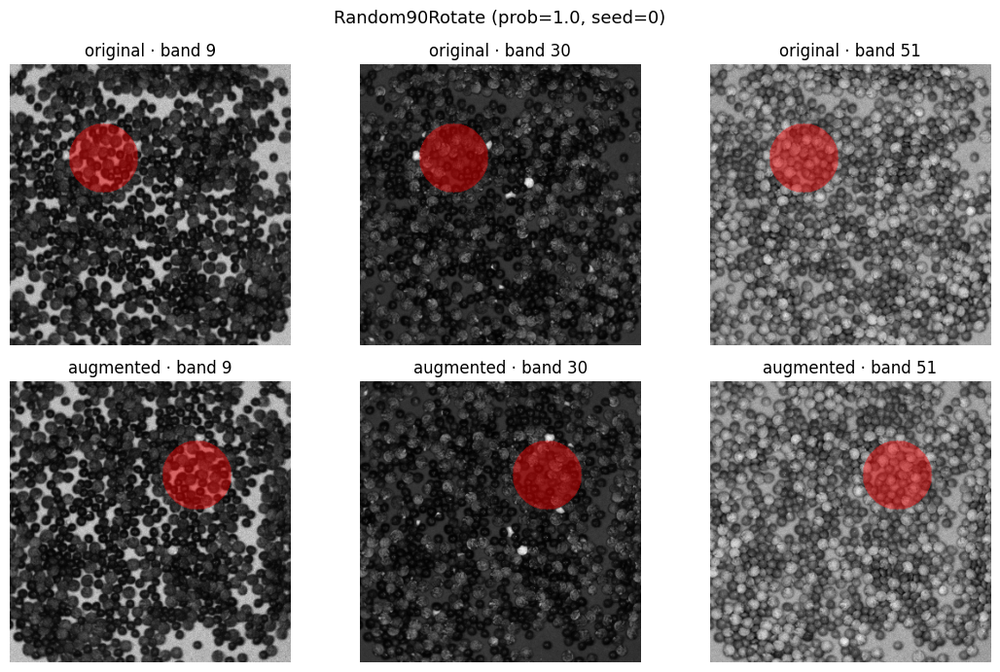

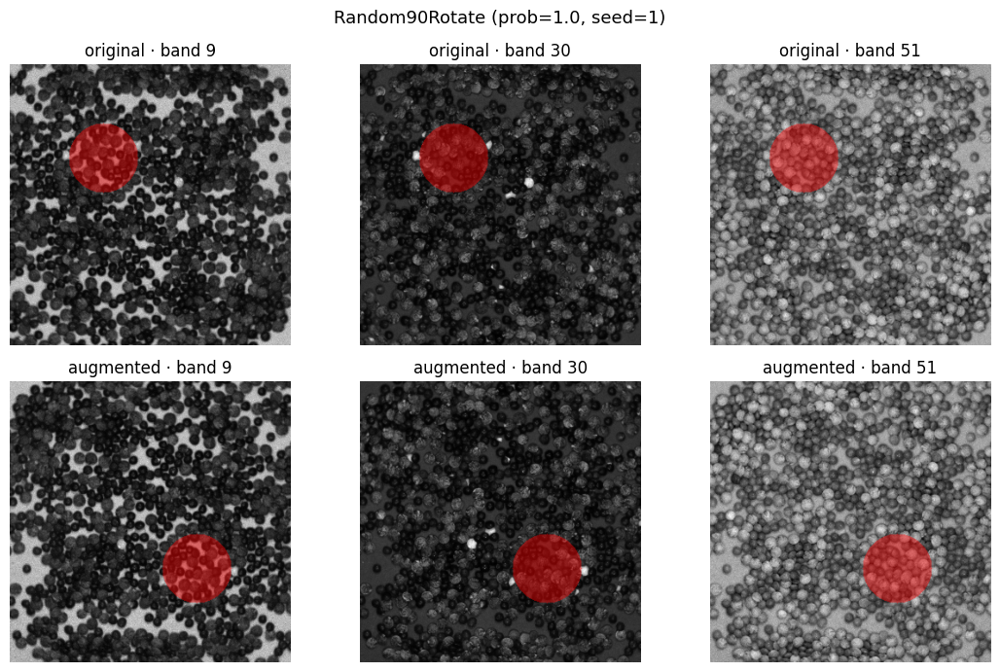

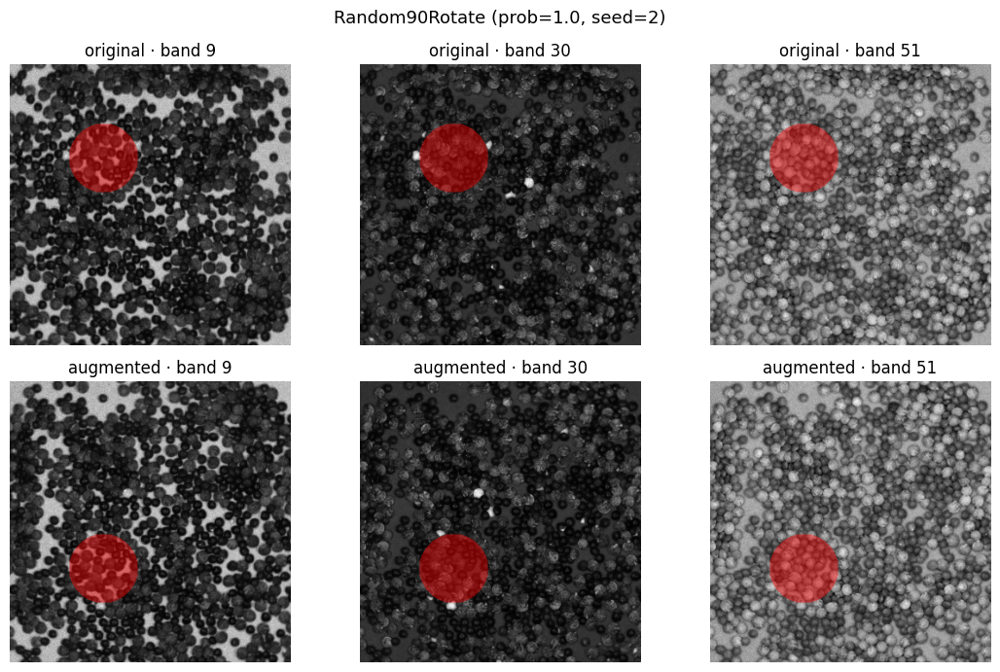

In [8]:
for seed in [0, 1, 2]:
    _ = run_single_transform(
        {"type": "Random90Rotate", "prob": 1.0},
        title=f"Random90Rotate (prob=1.0, seed={seed})",
        seed=seed,
    )

## 7 · `RandomSpatialCrop` (spatial)

Crops to a fixed `(H_out, W_out)` at a per-sample random offset, returning a smaller cube with the mask aligned. The crop below uses half the original spatial dimensions.

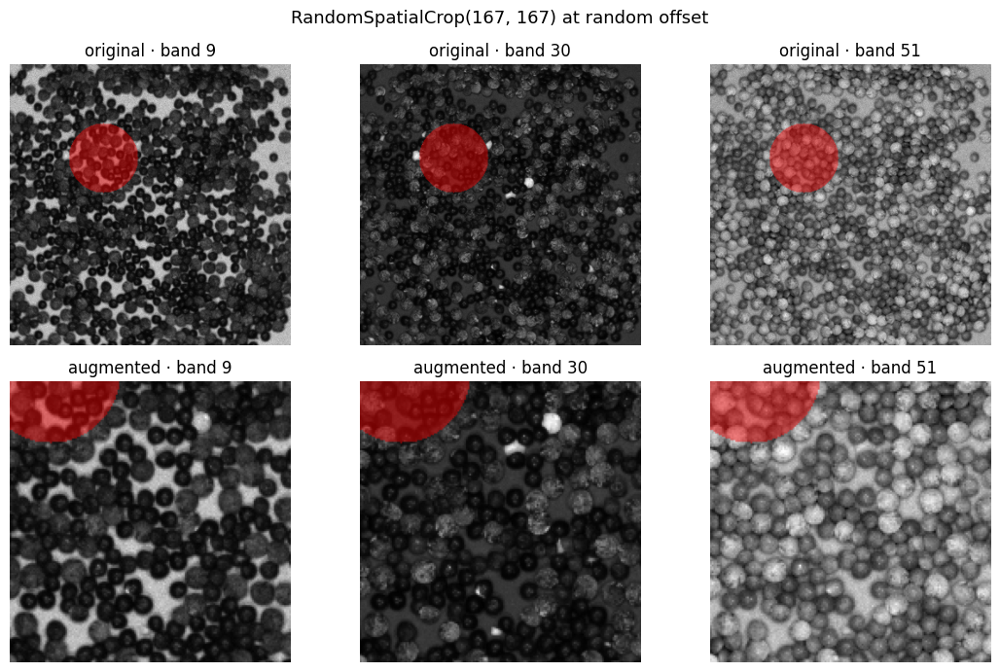

In [9]:
out_side = min(cube.shape[1], cube.shape[2]) // 2
_ = run_single_transform(
    {"type": "RandomSpatialCrop", "size": [out_side, out_side], "prob": 1.0},
    title=f"RandomSpatialCrop({out_side}, {out_side}) at random offset",
    seed=0,
)

## 8 · `GaussianBandNoise` (spectral)

Adds independent Gaussian noise `N(0, σ²)` to every `(pixel, band)` location.
With `per_band_scale=True` the noise amplitude is proportional to each band's own
standard deviation, matching real per-band shot noise where bands with higher
natural variation also have higher noise floor.

The spatial structure is completely untouched — the same pixel pattern is still there,
just with its spectral signature jittered. The model can no longer memorise exact
reflectance values and is forced to learn spectral *shape* rather than magnitude.

> **Note:** sigma=0.05 is a realistic production value. On this cube (reflectance,
> per-band std ≈ 0.07–0.24) it adds ~5 % of per-band std — intentionally subtle.
> The right panel below verifies numerically that the correct noise level was applied.

> Reference: Nalepa et al. 2019 (TGRS); Ahmad et al. 2024 §4.2.

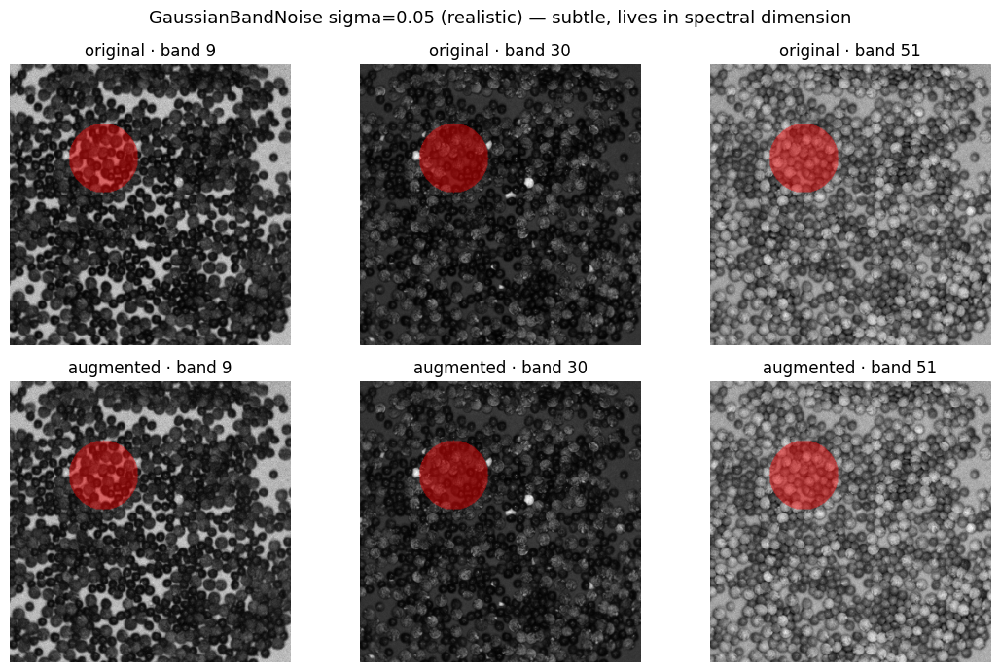

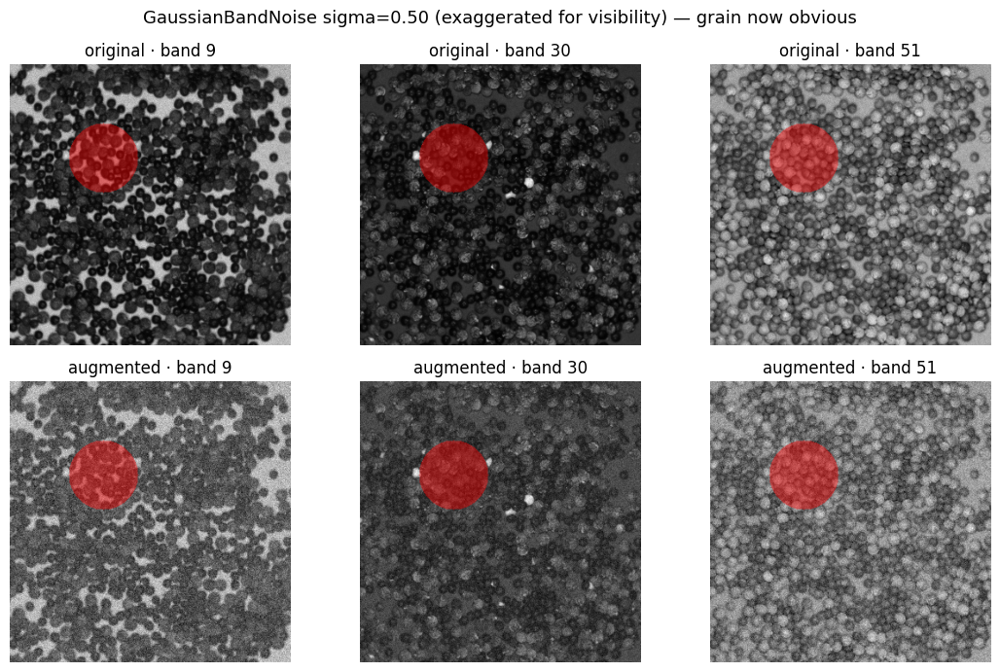

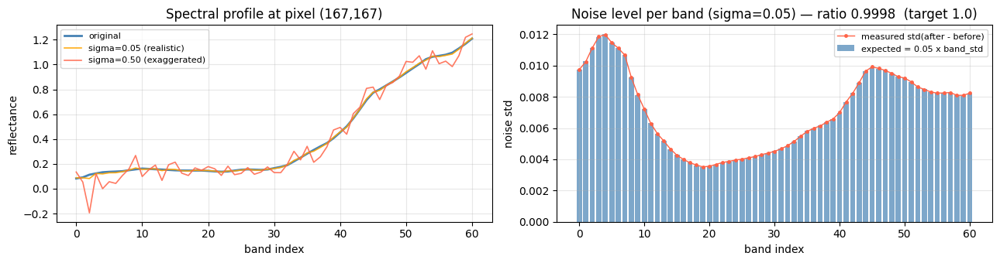

In [10]:
import numpy as np

from cuvis_ai_augment.node.compose import AugmentationCompose as _AC

# Realistic noise level (sigma=0.05) — intentionally subtle, ~5 % of per-band std
out_gn = run_single_transform(
    {"type": "GaussianBandNoise", "sigma": 0.05, "per_band_scale": True, "prob": 1.0},
    title="GaussianBandNoise sigma=0.05 (realistic) — subtle, lives in spectral dimension",
)

# Exaggerated noise (sigma=0.50) — same transform, turned up so the grain is obvious
out_gn_big = _AC(
    transforms=[{"type": "GaussianBandNoise", "sigma": 0.50, "per_band_scale": True, "prob": 1.0}],
    seed=0,
).forward(cube=cube, mask=mask)
show_before_after_3bands(
    cube,
    mask,
    out_gn_big["cube"],
    out_gn_big.get("mask"),
    title="GaussianBandNoise sigma=0.50 (exaggerated for visibility) — grain now obvious",
)

# ── Spectral profiles: realistic vs exaggerated ───────────────────────────────
py, px = H // 2, W // 2
spec_orig = cube[0, py, px, :].cpu().float().numpy()
spec_subtle = out_gn["cube"][0, py, px, :].cpu().float().numpy()
spec_big = out_gn_big["cube"][0, py, px, :].cpu().float().numpy()
xs = np.arange(C)

noise = (out_gn["cube"] - cube)[0].float()
pb_std = cube[0].float().std(dim=(0, 1)).cpu().numpy()
expect_std = 0.05 * pb_std
measured_std = noise.std(dim=(0, 1)).cpu().numpy()
ratio = measured_std.mean() / expect_std.mean()

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(13, 3.5))

ax1.plot(xs, spec_orig, color="steelblue", lw=2.0, label="original")
ax1.plot(xs, spec_subtle, color="orange", lw=1.2, label="sigma=0.05 (realistic)", alpha=0.9)
ax1.plot(xs, spec_big, color="tomato", lw=1.2, label="sigma=0.50 (exaggerated)", alpha=0.85)
ax1.set_xlabel("band index")
ax1.set_ylabel("reflectance")
ax1.set_title(f"Spectral profile at pixel ({py},{px})")
ax1.legend(fontsize=8)
ax1.grid(True, alpha=0.3)

ax2.bar(xs, expect_std, alpha=0.7, color="steelblue", label="expected = 0.05 x band_std")
ax2.plot(
    xs, measured_std, "o-", color="tomato", ms=2.5, lw=1.0, label="measured std(after - before)"
)
ax2.set_xlabel("band index")
ax2.set_ylabel("noise std")
ax2.set_title(f"Noise level per band (sigma=0.05) — ratio {ratio:.4f}  (target 1.0)")
ax2.legend(fontsize=8)
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

## 9 · `RandomBandDropout` (spectral)

Zeros a random `drop_fraction` of bands per sample. With 61 bands and
`drop_fraction=0.15`, roughly nine bands go to zero each call.
Every sample in the batch draws its own independent set of dropped bands.

Acts as spectral dropout: forces the model to produce correct output from any
arbitrary band subset — exactly the situation when some wavelengths hit
water-absorption windows, when a sensor channel fails, or when bands are
discarded during preprocessing.

In the three-band panel below, any column whose band index was dropped shows
a completely black "after" image. The bar chart identifies the exact dropped
band indices for this run.

> Reference: Ahmad et al. 2024 §4.3.

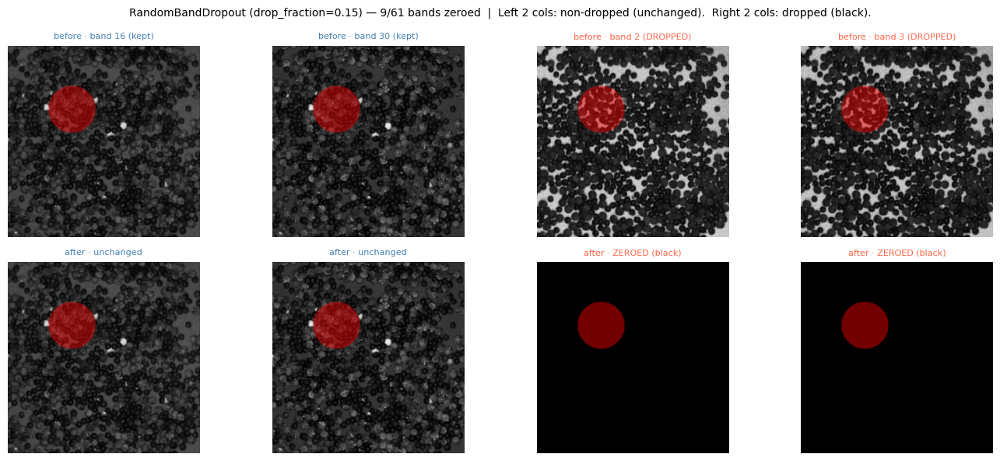

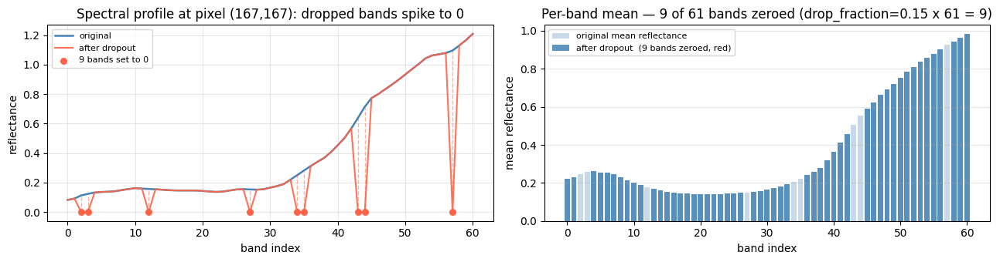

In [11]:
import numpy as np

from cuvis_ai_augment.node.compose import AugmentationCompose as _AC

out_bd = _AC(
    transforms=[{"type": "RandomBandDropout", "drop_fraction": 0.15, "prob": 1.0}],
    seed=0,
).forward(cube=cube, mask=mask)

# ── Identify dropped / kept bands ────────────────────────────────────────────
mean_b = cube[0].mean(dim=(0, 1)).cpu().float().numpy()
mean_a = out_bd["cube"][0].mean(dim=(0, 1)).cpu().float().numpy()
dropped = np.where((mean_a == 0) & (mean_b > 0))[0]
kept = np.where(~((mean_a == 0) & (mean_b > 0)))[0]
n_drop = len(dropped)

# Pick 2 dropped bands and 2 kept bands for the before/after panel
show_drop = dropped[:2]
show_kept = kept[[len(kept) // 4, len(kept) // 2]]  # spread across spectrum
show_bands = list(show_kept) + list(show_drop)  # kept first, dropped last

fig, axes = plt.subplots(2, 4, figsize=(14, 6))
for col, band in enumerate(show_bands):
    is_dropped = band in dropped
    label = f"band {band} (DROPPED)" if is_dropped else f"band {band} (kept)"
    color = "tomato" if is_dropped else "steelblue"

    img_b = overlay_mask(to_uint8_band(cube[0], band), mask[0])
    img_a = overlay_mask(to_uint8_band(out_bd["cube"][0], band), mask[0])

    axes[0, col].imshow(img_b)
    axes[0, col].set_title(f"before · {label}", fontsize=8, color=color)
    axes[0, col].axis("off")

    axes[1, col].imshow(img_a)
    axes[1, col].set_title(
        "after · ZEROED (black)" if is_dropped else "after · unchanged",
        fontsize=8,
        color=color,
    )
    axes[1, col].axis("off")

_title = (
    f"RandomBandDropout (drop_fraction=0.15) — {n_drop}/{C} bands zeroed  |  "
    f"Left 2 cols: non-dropped (unchanged).  Right 2 cols: dropped (black)."
)
fig.suptitle(_title, fontsize=10)
plt.tight_layout()
plt.show()

# ── Spectral profile + bar chart ─────────────────────────────────────────────
py, px = H // 2, W // 2
spec_b = cube[0, py, px, :].cpu().float().numpy()
spec_a = out_bd["cube"][0, py, px, :].cpu().float().numpy()
xs = np.arange(C)
colors = ["tomato" if i in set(dropped) else "steelblue" for i in xs]

fig2, (ax1, ax2) = plt.subplots(1, 2, figsize=(13, 3.5))

ax1.plot(xs, spec_b, color="steelblue", lw=1.8, label="original")
ax1.plot(xs, spec_a, color="tomato", lw=1.5, label="after dropout", alpha=0.9)
ax1.vlines(
    dropped, ymin=0, ymax=spec_b[dropped], colors="tomato", lw=1.0, alpha=0.5, linestyle="--"
)
ax1.scatter(
    dropped,
    np.zeros(len(dropped)),
    color="tomato",
    s=30,
    zorder=5,
    label=f"{n_drop} bands set to 0",
)
ax1.set_xlabel("band index")
ax1.set_ylabel("reflectance")
ax1.set_title(f"Spectral profile at pixel ({py},{px}): dropped bands spike to 0")
ax1.legend(fontsize=8)
ax1.grid(True, alpha=0.3)

ax2.bar(xs, mean_b, alpha=0.3, color="steelblue", label="original mean reflectance")
ax2.bar(xs, mean_a, color=colors, alpha=0.85, label=f"after dropout  ({n_drop} bands zeroed, red)")
ax2.set_xlabel("band index")
ax2.set_ylabel("mean reflectance")
ax2.set_title(
    f"Per-band mean — {n_drop} of {C} bands zeroed (drop_fraction=0.15 x {C} = {round(0.15 * C)})"
)
ax2.legend(fontsize=8)
ax2.grid(True, axis="y", alpha=0.3)

plt.tight_layout()
plt.show()

## 10 · `MultiplicativeIlluminationScaling` (photometric)

Multiplies the whole cube by a smooth random gain curve `g(λ) ∈ gain_range`.
A small number of random anchor values (controlled by `smoothness`) are sampled and
upsampled to `C` bands via linear interpolation, so adjacent bands scale together
rather than independently — matching the physics of lamp-temperature drift and
illumination-angle variation, which are spectrally correlated processes.

The spatial content is completely unchanged; only the radiometric amplitude shifts.
The right panel below recovers the applied gain curve from the spatial means,
showing the characteristic smooth shape.

> Reference: Roddan et al. 2024 (Calibration-Jitter, simplified); Nalepa 2019 §III-A.

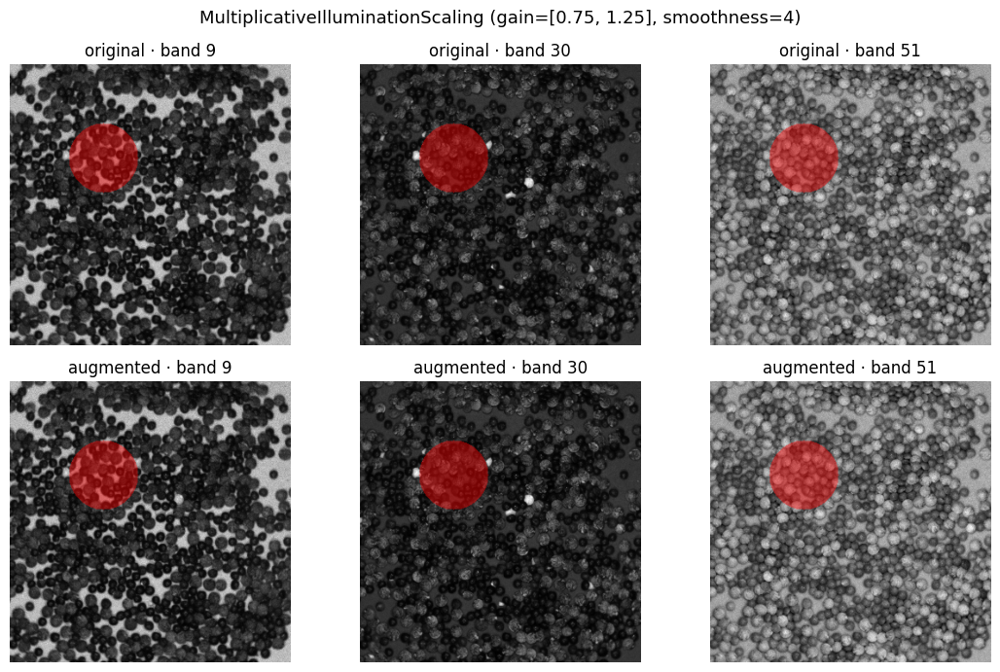

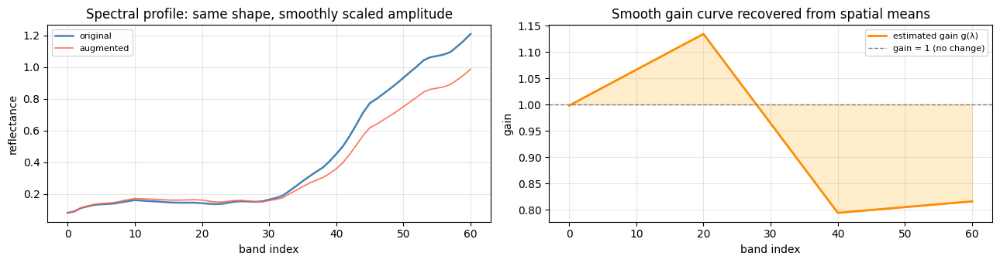

In [12]:
import numpy as np

out_il = run_single_transform(
    {
        "type": "MultiplicativeIlluminationScaling",
        "gain_range": [0.75, 1.25],
        "smoothness": 4,
        "prob": 1.0,
    },
    title="MultiplicativeIlluminationScaling (gain=[0.75, 1.25], smoothness=4)",
)

# ── Spectral insight: profile + gain curve ───────────────────────────────────
py, px = H // 2, W // 2
spec_b = cube[0, py, px, :].cpu().float().numpy()
spec_a = out_il["cube"][0, py, px, :].cpu().float().numpy()
xs = np.arange(C)

# Recover gain curve from spatial means (robust to scene variation)
mean_b = cube[0].float().mean(dim=(0, 1)).cpu().numpy().clip(1e-6)
mean_a = out_il["cube"][0].float().mean(dim=(0, 1)).cpu().numpy()
gain = mean_a / mean_b

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(13, 3.5))

ax1.plot(xs, spec_b, color="steelblue", lw=1.8, label="original")
ax1.plot(xs, spec_a, color="tomato", lw=1.2, label="augmented", alpha=0.9)
ax1.set_xlabel("band index")
ax1.set_ylabel("reflectance")
ax1.set_title("Spectral profile: same shape, smoothly scaled amplitude")
ax1.legend(fontsize=8)
ax1.grid(True, alpha=0.3)

ax2.plot(xs, gain, color="darkorange", lw=2.0, label="estimated gain g(λ)")
ax2.fill_between(xs, gain, 1.0, alpha=0.2, color="orange")
ax2.axhline(1.0, color="grey", lw=1, linestyle="--", label="gain = 1 (no change)")
ax2.set_xlabel("band index")
ax2.set_ylabel("gain")
ax2.set_title("Smooth gain curve recovered from spatial means")
ax2.legend(fontsize=8)
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

## 11 · `Cutout` (mixing / erasing)

Zeros a random rectangular patch in the spatial dimensions simultaneously across
all spectral bands, and sets the corresponding mask pixels to `mask_fill_value`
(default `0`). Patch position is drawn independently per sample.

The black rectangle appears at the same location in all three band panels — the
same spatial region is erased regardless of wavelength. The mask overlay vanishes
inside the patch, signalling to the loss function that those labels should be ignored.

Forces the model to reason from partial evidence: a foreign-object detector trained
only on fully-visible lentils will be surprised when a seed is partially occluded.
Cutout makes partial observations routine.

> Reference: DeVries & Taylor 2017; Haut et al. 2019 (HSI adaptation).

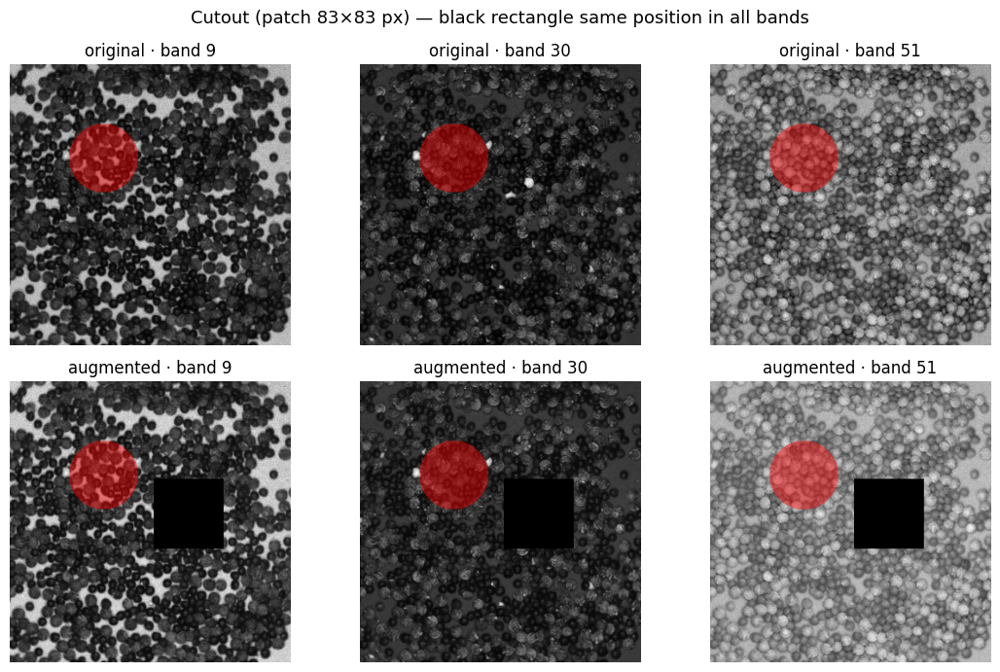

In [13]:
patch_h = min(cube.shape[1], cube.shape[2]) // 4
_ = run_single_transform(
    {"type": "Cutout", "patch_size": [patch_h, patch_h], "mask_fill_value": 0, "prob": 1.0},
    title=f"Cutout (patch {patch_h}×{patch_h} px) — black rectangle same position in all bands",
)

## 12 · Full `AugmentationCompose`

All seven concrete transforms chained — one from each family — with `prob < 1.0` so
not every transform fires on every call. Five different seeds illustrate how the
stochastic pipeline varies across training steps while remaining fully reproducible.

```yaml
transforms:
  - {type: RandomHorizontalFlip,           prob: 0.5}
  - {type: RandomVerticalFlip,             prob: 0.5}
  - {type: Random90Rotate,                 prob: 0.5}
  - {type: GaussianBandNoise,  sigma: 0.03, prob: 0.5}
  - {type: MultiplicativeIlluminationScaling, prob: 0.5}
  - {type: Cutout, patch_size: [16, 16],   prob: 0.5}
  - {type: RandomSpatialCrop, size: [out_side, out_side], prob: 1.0}
```

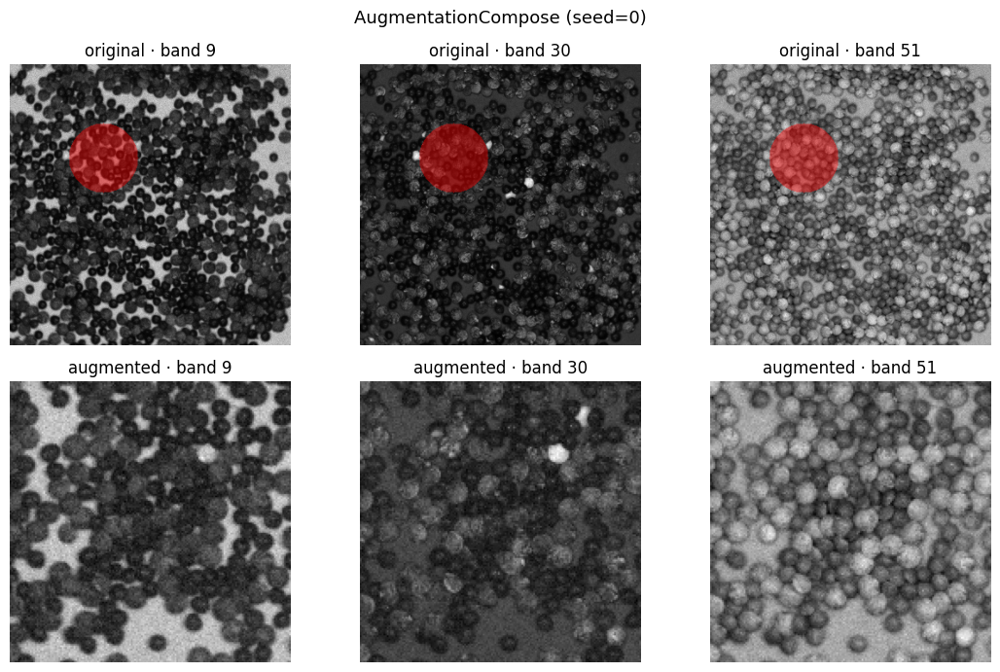

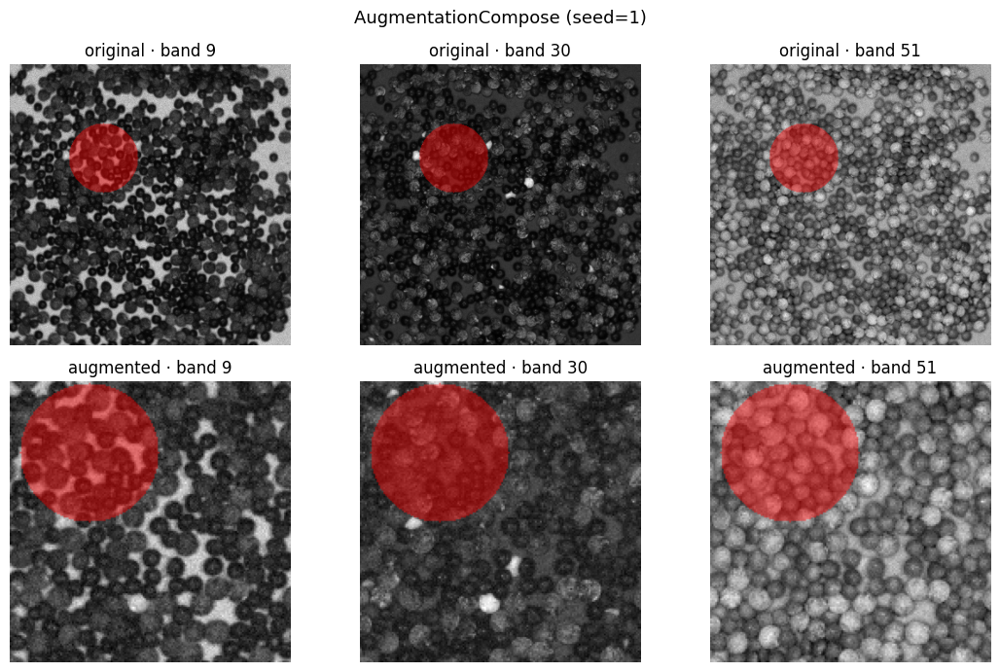

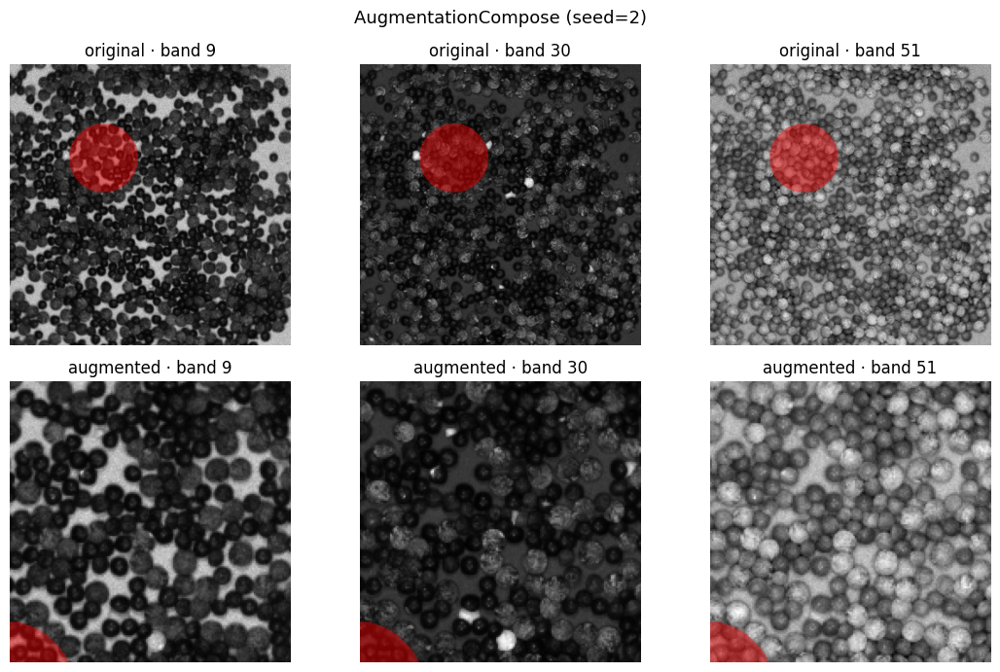

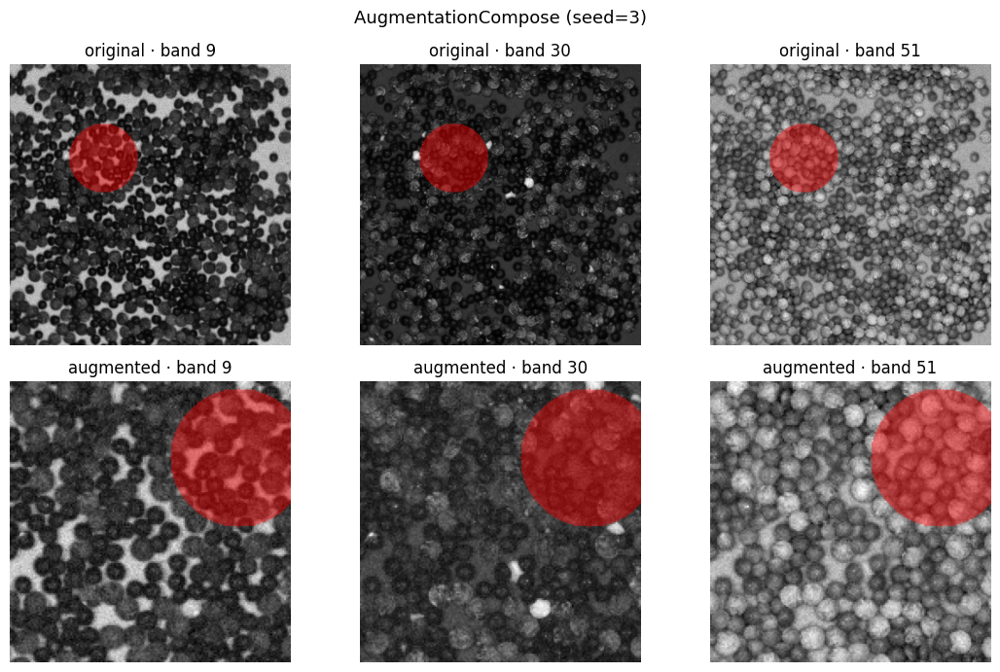

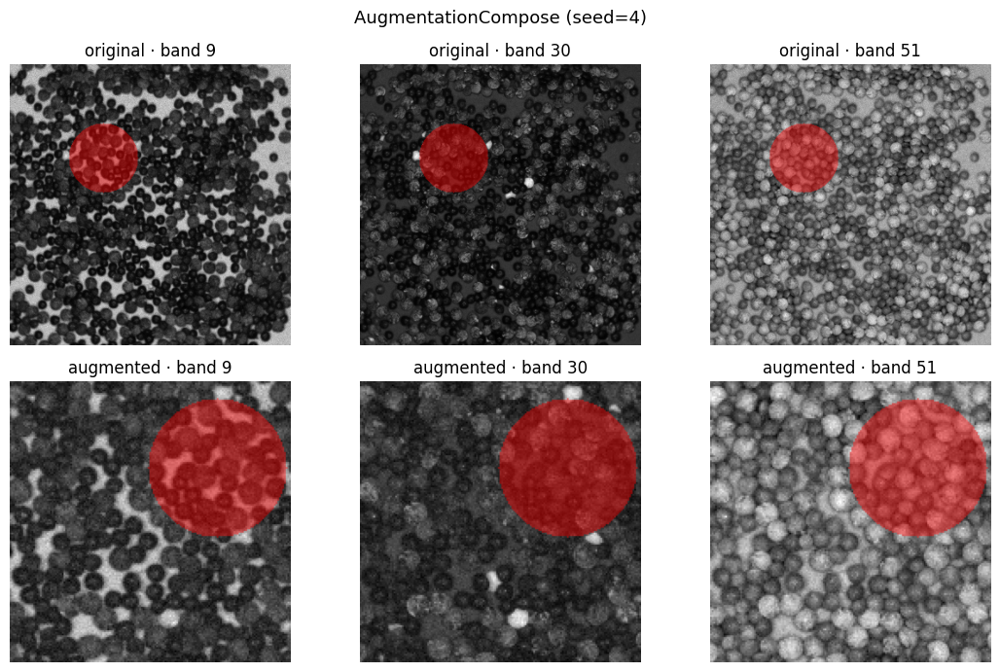

In [14]:
specs = [
    {"type": "RandomHorizontalFlip", "prob": 0.5},
    {"type": "RandomVerticalFlip", "prob": 0.5},
    {"type": "Random90Rotate", "prob": 0.5},
    {"type": "GaussianBandNoise", "sigma": 0.03, "prob": 0.5},
    {"type": "MultiplicativeIlluminationScaling", "prob": 0.5},
    {"type": "Cutout", "patch_size": [16, 16], "prob": 0.5},
    {"type": "RandomSpatialCrop", "size": [out_side, out_side], "prob": 1.0},
]
for seed in [0, 1, 2, 3, 4]:
    node = AugmentationCompose(transforms=specs, seed=seed)
    out = node.forward(cube=cube, mask=mask)
    show_before_after_3bands(
        cube, mask, out["cube"], out.get("mask"), title=f"AugmentationCompose (seed={seed})"
    )

## 13 · Programmatic sanity checks

The visualisation panels above are for humans. These cells are for the notebook itself — if a regression breaks any of these properties, the notebook fails loudly when `nbconvert --execute`'s the file in CI / pre-release.

Properties checked:

- **Idempotency under double-flip** — `HFlip ∘ HFlip == identity`, same for `VFlip`. Holds for `prob=1.0`.
- **Band-mean invariance under flip** — flipping doesn't add or remove energy, so the per-band mean must be unchanged.
- **Mask-cube co-location** — for `RandomHorizontalFlip(prob=1.0)`, a marker pixel must land at the mirrored coordinate in *both* the cube and the mask.
- **Crop output shape** — `RandomSpatialCrop(size=(s, s))` produces a `(B, s, s, C)` cube.

In [15]:
# 9a. HFlip ∘ HFlip == identity.
hflip = AugmentationCompose(transforms=[{"type": "RandomHorizontalFlip", "prob": 1.0}], seed=0)
once = hflip.forward(cube=cube, mask=mask)
twice = hflip.forward(cube=once["cube"], mask=once["mask"])
assert torch.equal(twice["cube"], cube), "HFlip ∘ HFlip should equal identity on the cube."
assert torch.equal(twice["mask"], mask), "HFlip ∘ HFlip should equal identity on the mask."

# 9b. VFlip is similarly involutive.
vflip = AugmentationCompose(transforms=[{"type": "RandomVerticalFlip", "prob": 1.0}], seed=0)
v_once = vflip.forward(cube=cube, mask=mask)
v_twice = vflip.forward(cube=v_once["cube"], mask=v_once["mask"])
assert torch.equal(v_twice["cube"], cube)

# 9c. Per-band mean is invariant under any flip (no energy change).
mean_before = cube.mean(dim=(1, 2))  # (B, C)
mean_after = once["cube"].mean(dim=(1, 2))
assert torch.allclose(mean_before, mean_after, atol=1e-5), "Per-band mean drifted under HFlip."

# 9d. Marker pixel co-location through HFlip(prob=1.0).
probe_cube = cube.clone()
probe_mask = mask.clone()
probe_cube[0, 7, 11, :] = 999.0
probe_mask[0, 7, 11] = 42
p_out = hflip.forward(cube=probe_cube, mask=probe_mask)
W = probe_cube.shape[2]
expected_w = W - 1 - 11
assert p_out["cube"][0, 7, expected_w, 0].item() == 999.0
assert int(p_out["mask"][0, 7, expected_w].item()) == 42

# 9e. Crop output shape.
crop = AugmentationCompose(
    transforms=[{"type": "RandomSpatialCrop", "size": [out_side, out_side], "prob": 1.0}],
    seed=0,
)
c_out = crop.forward(cube=cube, mask=mask)
assert tuple(c_out["cube"].shape) == (cube.shape[0], out_side, out_side, cube.shape[3])
assert tuple(c_out["mask"].shape) == (cube.shape[0], out_side, out_side)

print("All sanity checks passed.")

All sanity checks passed.


## 13 · Takeaways

- **`execution_stages={TRAIN}`** — `AugmentationCompose` is a no-op outside training.
  No need to remove it from your pipeline YAML for validation or inference runs.
- **Seed once at the Node** — `seed:` on `AugmentationCompose` drives the shared
  `torch.Generator` that every transform draws from. Reproducible runs need only this
  seed plus the data-loader seed.
- **Three-band sanity is cheap** — whenever you add a new transform, render the 2×3
  panel. If band 0 and band 30 disagree on what was applied, there is an axis bug.
- **Spectral transforms leave geometry intact** — `GaussianBandNoise`,
  `RandomBandDropout`, and `MultiplicativeIlluminationScaling` never change pixel
  positions, so the mask always passes through unchanged.
- **Reflectance loading matters** — loading the cube in calibrated reflectance
  (`ProcessingMode.Reflectance`, then / 10 000) gives physically meaningful per-band
  stds (0.07–0.24 here) compared to raw max-normalisation (0.01–0.13). Augmentation
  hyperparameters like `sigma` mean something concrete: *fraction of per-band std*.
- **`Random90Rotate` wants square cubes** — when k is odd the spatial dimensions swap.
  Centre-crop or pad before this transform if your sensor output is not square.
- **Mask fill values** — `Cutout`'s `mask_fill_value` should match the ignore-label
  used in your downstream loss (e.g. `255` for cross-entropy ignore or `-1` for some
  segmentation frameworks).
